In [1]:
from lightgbm import LGBMRegressor, early_stopping, log_evaluation
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import optuna
import warnings
import json

In [2]:
warnings.filterwarnings('ignore')
%matplotlib inline

In [3]:
dataset_map = {'1': 'Energy', '2': 'Stock', '3': 'Traffic', '4': 'Weather'}
dataset_choice = input("Select dataset (1. Energy 2. Stock 3. Traffic 4. Weather): ")
selected_dataset = dataset_map.get(dataset_choice)

Select dataset (1. Energy 2. Stock 3. Traffic 4. Weather):  2


In [4]:
base_models = ['LSTM', 'Transformer', 'LiquidML', 'XGBoost']
selected_models = []
for model in base_models:
    choice = input(f"Include {model} in blending? (y/n): ")
    if choice.lower() == 'y':
        selected_models.append(model)

Include LSTM in blending? (y/n):  y
Include Transformer in blending? (y/n):  y
Include LiquidML in blending? (y/n):  y
Include XGBoost in blending? (y/n):  y


In [5]:
dataset_files = {
    'Energy': '../datasets/AEP_hourly_processed.xlsx',
    'Stock': '../datasets/Tesla_Stock.xlsx',
    'Traffic': '../datasets/traffic.xlsx',
    'Weather': '../datasets/jena_climate.xlsx'
}

selected_file = dataset_files[selected_dataset]

X_train_meta, X_test_meta = [], []
for model in selected_models:
    X_train_meta.append(np.load(f"../{model}/predictions/{selected_dataset}_{model}_train.npy").reshape(-1))
    X_test_meta.append(np.load(f"../{model}/predictions/{selected_dataset}_{model}_test.npy").reshape(-1))

X_train_meta = np.stack(X_train_meta, axis=1)
X_test_meta = np.stack(X_test_meta, axis=1)

In [6]:
df = pd.read_excel(selected_file)
if selected_dataset == "Energy":
    target_column = "AEP_MW"
    df = df.iloc[:5000]
elif selected_dataset == "Stock":
    target_column = "Close"
    df = df.iloc[-2000:]
elif selected_dataset == "Traffic":
    target_column = "Vehicles"
    df = df.iloc[-3000:]
else:
    target_column = "Tpot (K)"
    df = df.iloc[::144]

full_target = df[target_column].values
split_idx = int(len(full_target) * 0.8)
y_train = full_target[:split_idx][60:]
y_test = full_target[split_idx:][60:]

In [7]:
X_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train_meta_scaled = X_scaler.fit_transform(X_train_meta)
X_test_meta_scaled = X_scaler.transform(X_test_meta)

y_train_scaled = y_scaler.fit_transform(y_train.reshape(-1, 1)).reshape(-1)
y_test_scaled = y_scaler.transform(y_test.reshape(-1, 1)).reshape(-1)

X_val_meta = X_test_meta_scaled
y_val = y_test_scaled

In [8]:
def objective(trial):
    params = {
        "n_estimators": 2000,
        "learning_rate": trial.suggest_loguniform("learning_rate", 1e-3, 0.1),
        "num_leaves": trial.suggest_int("num_leaves", 32, 128),
        "max_depth": trial.suggest_int("max_depth", 6, 10),
        "min_child_samples": trial.suggest_int("min_child_samples", 10, 100),
        "subsample": trial.suggest_uniform("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_uniform("colsample_bytree", 0.5, 1.0),
        "reg_alpha": trial.suggest_loguniform("reg_alpha", 1e-4, 20.0),
        "reg_lambda": trial.suggest_loguniform("reg_lambda", 1e-4, 20.0),
        "random_state": 42
    }

    model = LGBMRegressor(**params)
    model.fit(
        X_train_meta_scaled, y_train_scaled,
        eval_set=[(X_val_meta, y_val)],
        eval_metric="rmse",
        callbacks=[early_stopping(100), log_evaluation(0)]
    )

    preds = model.predict(X_test_meta_scaled)
    return mean_squared_error(y_test_scaled, preds, squared=False)

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=200)

[I 2025-05-31 01:27:34,160] A new study created in memory with name: no-name-44989986-4041-4c01-8f20-9fc09a9f2303
  File "C:\Users\naman\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\naman\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\naman\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\naman\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:34,551] Trial 0 finished with value: 0.10266295815146338 and parameters: {'learning_rate': 0.012960864771724012, 'num_leaves': 34, 'max_depth': 9, 'min_child_samples': 58, 'subsample': 0.6189057331933845, 'colsample_bytree': 0.5269818759028085, 'reg_alpha': 0.01661653882907474, 'reg_lambda': 0.0023644778439396463}. Best is trial 0 with value: 0.10266295815146338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:34,637] Trial 1 finished with value: 0.11468482396900206 and parameters: {'learning_rate': 0.0860992956542284, 'num_leaves': 59, 'max_depth': 9, 'min_child_samples': 99, 'subsample': 0.7015055046354575, 'colsample_bytree': 0.54513685317751, 'reg_alpha': 0.0002810807705332439, 'reg_lambda': 0.25946627602484196}. Best is trial 0 with value: 0.10266295815146338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:34,791] Trial 2 finished with value: 0.12366595717408564 and parameters: {'learning_rate': 0.03056663647100946, 'num_leaves': 102, 'max_depth': 10, 'min_child_samples': 42, 'subsample': 0.9351322292787949, 'colsample_bytree': 0.979472676250636, 'reg_alpha': 0.00012222085977777359, 'reg_lambda': 0.8784887193088718}. Best is trial 0 with value: 0.10266295815146338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:34,977] Trial 3 finished with value: 0.12213255228704437 and parameters: {'learning_rate': 0.013790015475982112, 'num_leaves': 105, 'max_depth': 8, 'min_child_samples': 49, 'subsample': 0.9219910536336224, 'colsample_bytree': 0.8933489679651359, 'reg_alpha': 0.05526724585466424, 'reg_lambda': 0.029331124857900497}. Best is trial 0 with value: 0.10266295815146338.
[I 2025-05-31 01:27:35,074] Trial 4 finished with value: 0.1342428882799742 and parameters: {'learning_rate': 0.036633682987619334, 'num_leaves': 94, 'max_depth': 9, 'min_child_samples': 96, 'subsample': 0.9035279572285988, 'colsample_bytree': 0.9894072547789113, 'reg_alpha': 0.6708376031137187, 'reg_lambda': 8.990963885080912}. Best is trial 0 with value: 0.10266295815146338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[243]	valid_0's rmse: 0.122133	valid_0's l2: 0.0149164
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-05-31 01:27:35,466] Trial 5 finished with value: 0.12266867583988492 and parameters: {'learning_rate': 0.011311660260870883, 'num_leaves': 78, 'max_depth': 6, 'min_child_samples': 30, 'subsample': 0.5233417210450342, 'colsample_bytree': 0.8826823106618666, 'reg_alpha': 0.002480836319652876, 'reg_lambda': 0.6554480330484586}. Best is trial 0 with value: 0.10266295815146338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:36,760] Trial 6 finished with value: 0.12288084701370372 and parameters: {'learning_rate': 0.001236273232498588, 'num_leaves': 61, 'max_depth': 6, 'min_child_samples': 20, 'subsample': 0.971222354384286, 'colsample_bytree': 0.5453039005027862, 'reg_alpha': 0.5094979688413025, 'reg_lambda': 6.62803698655146}. Best is trial 0 with value: 0.10266295815146338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:36,964] Trial 7 finished with value: 0.1248741623957654 and parameters: {'learning_rate': 0.0186392503944648, 'num_leaves': 75, 'max_depth': 6, 'min_child_samples': 82, 'subsample': 0.7457554944302958, 'colsample_bytree': 0.9028030620244034, 'reg_alpha': 0.003942720778047758, 'reg_lambda': 0.049517950516069144}. Best is trial 0 with value: 0.10266295815146338.
[I 2025-05-31 01:27:37,010] Trial 8 finished with value: 0.11121334367148968 and parameters: {'learning_rate': 0.09259768544677048, 'num_leaves': 89, 'max_depth': 8, 'min_child_samples': 30, 'subsample': 0.8327969414390075, 'colsample_bytree': 0.8072911474195836, 'reg_alpha': 4.218325321586344, 'reg_lambda': 0.007033044728182056}. Best is trial 0 with value: 0.10266295815146338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:37,202] Trial 9 finished with value: 0.1033951540900951 and parameters: {'learning_rate': 0.011776844569997889, 'num_leaves': 128, 'max_depth': 8, 'min_child_samples': 63, 'subsample': 0.9304964320056428, 'colsample_bytree': 0.5876480574903077, 'reg_alpha': 0.09039836185992153, 'reg_lambda': 0.00016530461300628892}. Best is trial 0 with value: 0.10266295815146338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:37,821] Trial 10 finished with value: 0.11710947987886795 and parameters: {'learning_rate': 0.0039625228802762135, 'num_leaves': 33, 'max_depth': 10, 'min_child_samples': 65, 'subsample': 0.5972949499169433, 'colsample_bytree': 0.6692161167486577, 'reg_alpha': 0.004690634935913938, 'reg_lambda': 0.0005285018430105259}. Best is trial 0 with value: 0.10266295815146338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:38,275] Trial 11 finished with value: 0.1145252800188639 and parameters: {'learning_rate': 0.004878506748529209, 'num_leaves': 128, 'max_depth': 7, 'min_child_samples': 68, 'subsample': 0.6688802431137237, 'colsample_bytree': 0.6477182707217763, 'reg_alpha': 0.04977044422876494, 'reg_lambda': 0.0003435528465843685}. Best is trial 0 with value: 0.10266295815146338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:38,689] Trial 12 finished with value: 0.10438668412281149 and parameters: {'learning_rate': 0.0055126843617517175, 'num_leaves': 34, 'max_depth': 9, 'min_child_samples': 63, 'subsample': 0.8134696900197103, 'colsample_bytree': 0.5059764131825422, 'reg_alpha': 0.2581998869839549, 'reg_lambda': 0.0014692420154384213}. Best is trial 0 with value: 0.10266295815146338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:39,969] Trial 13 finished with value: 0.11664992620392067 and parameters: {'learning_rate': 0.0015866561880859948, 'num_leaves': 127, 'max_depth': 7, 'min_child_samples': 77, 'subsample': 0.6135591910258653, 'colsample_bytree': 0.630518396232644, 'reg_alpha': 0.016207350117790814, 'reg_lambda': 0.00010423773889872622}. Best is trial 0 with value: 0.10266295815146338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:40,272] Trial 14 finished with value: 0.11716146892700006 and parameters: {'learning_rate': 0.007923823948004935, 'num_leaves': 51, 'max_depth': 8, 'min_child_samples': 52, 'subsample': 0.8322415090433167, 'colsample_bytree': 0.7284843777381772, 'reg_alpha': 0.13608273556229744, 'reg_lambda': 0.003301847172495705}. Best is trial 0 with value: 0.10266295815146338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:40,910] Trial 15 finished with value: 0.09858222802412302 and parameters: {'learning_rate': 0.002504265865860743, 'num_leaves': 113, 'max_depth': 9, 'min_child_samples': 79, 'subsample': 0.5065528951331086, 'colsample_bytree': 0.5955017288193459, 'reg_alpha': 12.215090959455539, 'reg_lambda': 0.00013898894080624548}. Best is trial 15 with value: 0.09858222802412302.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:41,533] Trial 16 finished with value: 0.11342690538663612 and parameters: {'learning_rate': 0.002753295209403016, 'num_leaves': 110, 'max_depth': 9, 'min_child_samples': 84, 'subsample': 0.5163407390624878, 'colsample_bytree': 0.725367971251399, 'reg_alpha': 8.425161022047417, 'reg_lambda': 0.0011276735644440627}. Best is trial 15 with value: 0.09858222802412302.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:42,246] Trial 17 finished with value: 0.09694015761120074 and parameters: {'learning_rate': 0.0022265596102286128, 'num_leaves': 46, 'max_depth': 10, 'min_child_samples': 74, 'subsample': 0.5798560969038185, 'colsample_bytree': 0.5064885810576, 'reg_alpha': 1.984040042124478, 'reg_lambda': 0.011219118080034299}. Best is trial 17 with value: 0.09694015761120074.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:43,156] Trial 18 finished with value: 0.09643180627622447 and parameters: {'learning_rate': 0.0020530266393074628, 'num_leaves': 115, 'max_depth': 10, 'min_child_samples': 75, 'subsample': 0.567166624346558, 'colsample_bytree': 0.593215609585853, 'reg_alpha': 1.3036847932283429, 'reg_lambda': 0.01563218307464911}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:44,059] Trial 19 finished with value: 0.15665766053701052 and parameters: {'learning_rate': 0.0010352743835383893, 'num_leaves': 51, 'max_depth': 10, 'min_child_samples': 72, 'subsample': 0.5652179932117832, 'colsample_bytree': 0.5829925163638853, 'reg_alpha': 1.8191721361803284, 'reg_lambda': 0.016994638857365216}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:44,739] Trial 20 finished with value: 0.12874410924461824 and parameters: {'learning_rate': 0.001779059157666813, 'num_leaves': 68, 'max_depth': 10, 'min_child_samples': 91, 'subsample': 0.6740425994574238, 'colsample_bytree': 0.6875932654832038, 'reg_alpha': 2.0127036302813264, 'reg_lambda': 0.11174209147504705}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:45,225] Trial 21 finished with value: 0.0965423124016731 and parameters: {'learning_rate': 0.0026197350178379635, 'num_leaves': 114, 'max_depth': 10, 'min_child_samples': 87, 'subsample': 0.5024806021017315, 'colsample_bytree': 0.6082031304738815, 'reg_alpha': 19.06773075890544, 'reg_lambda': 0.006224014260687397}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:45,585] Trial 22 finished with value: 0.10022763335015539 and parameters: {'learning_rate': 0.002736927727492712, 'num_leaves': 116, 'max_depth': 10, 'min_child_samples': 92, 'subsample': 0.5731021823921526, 'colsample_bytree': 0.614562919804759, 'reg_alpha': 17.28737362227229, 'reg_lambda': 0.012395911268993021}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:46,326] Trial 23 finished with value: 0.12259595490356452 and parameters: {'learning_rate': 0.00219463021303474, 'num_leaves': 89, 'max_depth': 10, 'min_child_samples': 87, 'subsample': 0.5616854002380519, 'colsample_bytree': 0.7796140560013474, 'reg_alpha': 2.67394331827406, 'reg_lambda': 0.007029337129047425}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:46,751] Trial 24 finished with value: 0.09660019250711621 and parameters: {'learning_rate': 0.004141656245180589, 'num_leaves': 119, 'max_depth': 10, 'min_child_samples': 73, 'subsample': 0.650013612237845, 'colsample_bytree': 0.5598128520613135, 'reg_alpha': 0.840151031681056, 'reg_lambda': 0.0884992067389626}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:47,220] Trial 25 finished with value: 0.0979813797544437 and parameters: {'learning_rate': 0.003643748337474418, 'num_leaves': 119, 'max_depth': 10, 'min_child_samples': 72, 'subsample': 0.6371826526552333, 'colsample_bytree': 0.5689711931479378, 'reg_alpha': 0.6967911812380867, 'reg_lambda': 0.0361136830895069}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:47,517] Trial 26 finished with value: 0.1158493715774634 and parameters: {'learning_rate': 0.006906370866895836, 'num_leaves': 98, 'max_depth': 9, 'min_child_samples': 84, 'subsample': 0.5462075677109629, 'colsample_bytree': 0.6960028417656633, 'reg_alpha': 5.5459421373578595, 'reg_lambda': 0.08564852271309248}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[491]	valid_0's rmse: 0.115849	valid_0's l2: 0.0134211
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-05-31 01:27:48,002] Trial 27 finished with value: 0.11844329908052903 and parameters: {'learning_rate': 0.0037335567825768586, 'num_leaves': 120, 'max_depth': 10, 'min_child_samples': 58, 'subsample': 0.7280286109748694, 'colsample_bytree': 0.6477108820864734, 'reg_alpha': 0.25120758015272554, 'reg_lambda': 0.17069944897784126}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:48,871] Trial 28 finished with value: 0.10740350450112018 and parameters: {'learning_rate': 0.0016494635908684307, 'num_leaves': 105, 'max_depth': 7, 'min_child_samples': 89, 'subsample': 0.6471869290869356, 'colsample_bytree': 0.5622089299350288, 'reg_alpha': 1.0015368795986699, 'reg_lambda': 0.5332135371015476}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[1987]	valid_0's rmse: 0.107404	valid_0's l2: 0.0115

[I 2025-05-31 01:27:49,077] Trial 29 finished with value: 0.09754453258830773 and parameters: {'learning_rate': 0.0068376472500382085, 'num_leaves': 121, 'max_depth': 9, 'min_child_samples': 45, 'subsample': 0.6127005640120121, 'colsample_bytree': 0.6191499810124377, 'reg_alpha': 19.531333621001966, 'reg_lambda': 3.0894178414535256}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:49,584] Trial 30 finished with value: 0.10401894844725229 and parameters: {'learning_rate': 0.0035457003385172357, 'num_leaves': 111, 'max_depth': 10, 'min_child_samples': 56, 'subsample': 0.789833218793929, 'colsample_bytree': 0.5258277273987224, 'reg_alpha': 0.019366378628605064, 'reg_lambda': 0.0028225317187619034}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:50,214] Trial 31 finished with value: 0.09732941636321385 and parameters: {'learning_rate': 0.002054560142466908, 'num_leaves': 86, 'max_depth': 10, 'min_child_samples': 75, 'subsample': 0.5385688149616462, 'colsample_bytree': 0.5075758639814938, 'reg_alpha': 4.227587430112373, 'reg_lambda': 0.0061960114356436535}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:51,072] Trial 32 finished with value: 0.11309524962221086 and parameters: {'learning_rate': 0.0012923057562197271, 'num_leaves': 46, 'max_depth': 10, 'min_child_samples': 72, 'subsample': 0.5863675477938446, 'colsample_bytree': 0.5317725798121888, 'reg_alpha': 1.0887815327071693, 'reg_lambda': 0.018335724348037933}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:51,656] Trial 33 finished with value: 0.10244700952741603 and parameters: {'learning_rate': 0.00300694708611179, 'num_leaves': 98, 'max_depth': 9, 'min_child_samples': 80, 'subsample': 0.500575593974593, 'colsample_bytree': 0.554655922049604, 'reg_alpha': 0.28461361336582236, 'reg_lambda': 0.061633943615743834}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:51,977] Trial 34 finished with value: 0.10949695888775866 and parameters: {'learning_rate': 0.005377513406469791, 'num_leaves': 107, 'max_depth': 10, 'min_child_samples': 100, 'subsample': 0.6386266418382494, 'colsample_bytree': 0.5955414256715739, 'reg_alpha': 5.685816341611955, 'reg_lambda': 0.229168227340691}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:52,664] Trial 35 finished with value: 0.1131784545156554 and parameters: {'learning_rate': 0.0017999557657095394, 'num_leaves': 69, 'max_depth': 9, 'min_child_samples': 95, 'subsample': 0.7032207460090074, 'colsample_bytree': 0.5026824289899795, 'reg_alpha': 2.1741366411491736, 'reg_lambda': 0.02619863970347634}. Best is trial 18 with value: 0.09643180627622447.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:53,054] Trial 36 finished with value: 0.09547008662700232 and parameters: {'learning_rate': 0.0047172967159973675, 'num_leaves': 100, 'max_depth': 10, 'min_child_samples': 68, 'subsample': 0.548127050900737, 'colsample_bytree': 0.5643511266456961, 'reg_alpha': 9.2653817725522, 'reg_lambda': 0.009220745790978278}. Best is trial 36 with value: 0.09547008662700232.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:53,298] Trial 37 finished with value: 0.10858835610478618 and parameters: {'learning_rate': 0.009015804232224462, 'num_leaves': 101, 'max_depth': 9, 'min_child_samples': 68, 'subsample': 0.5413023355296646, 'colsample_bytree': 0.6615857051796579, 'reg_alpha': 7.486418341859051, 'reg_lambda': 0.00405823929785961}. Best is trial 36 with value: 0.09547008662700232.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:53,466] Trial 38 finished with value: 0.10160338750384174 and parameters: {'learning_rate': 0.044180890015362254, 'num_leaves': 115, 'max_depth': 10, 'min_child_samples': 61, 'subsample': 0.5443999450648132, 'colsample_bytree': 0.6143027457364846, 'reg_alpha': 0.00026182093805653556, 'reg_lambda': 0.0010007430053075817}. Best is trial 36 with value: 0.09547008662700232.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:53,670] Trial 39 finished with value: 0.10701523387753442 and parameters: {'learning_rate': 0.02040475304908592, 'num_leaves': 124, 'max_depth': 9, 'min_child_samples': 35, 'subsample': 0.6736962208031504, 'colsample_bytree': 0.8547894939334965, 'reg_alpha': 10.614112487026185, 'reg_lambda': 1.3284282796025275}. Best is trial 36 with value: 0.09547008662700232.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:53,975] Trial 40 finished with value: 0.09908057744630018 and parameters: {'learning_rate': 0.005460578796643796, 'num_leaves': 93, 'max_depth': 10, 'min_child_samples': 68, 'subsample': 0.6100954990522311, 'colsample_bytree': 0.547417335206439, 'reg_alpha': 0.3985238894375334, 'reg_lambda': 0.03370685801977815}. Best is trial 36 with value: 0.09547008662700232.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:54,363] Trial 41 finished with value: 0.0962615235546701 and parameters: {'learning_rate': 0.004493356738782376, 'num_leaves': 108, 'max_depth': 10, 'min_child_samples': 76, 'subsample': 0.5876013466576853, 'colsample_bytree': 0.5246707981546433, 'reg_alpha': 1.0146401868393133, 'reg_lambda': 0.01314996662141461}. Best is trial 36 with value: 0.09547008662700232.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:54,698] Trial 42 finished with value: 0.10790781314927744 and parameters: {'learning_rate': 0.004512328859900934, 'num_leaves': 109, 'max_depth': 10, 'min_child_samples': 85, 'subsample': 0.5222747672179173, 'colsample_bytree': 0.5693228623991193, 'reg_alpha': 0.9116065284300869, 'reg_lambda': 0.009708868474506667}. Best is trial 36 with value: 0.09547008662700232.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:55,169] Trial 43 finished with value: 0.10672182842216457 and parameters: {'learning_rate': 0.00315635340251579, 'num_leaves': 103, 'max_depth': 10, 'min_child_samples': 12, 'subsample': 0.5910208012385533, 'colsample_bytree': 0.5304360465907629, 'reg_alpha': 3.368878164405113, 'reg_lambda': 0.001663437629357423}. Best is trial 36 with value: 0.09547008662700232.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:55,565] Trial 44 finished with value: 0.09909804219729872 and parameters: {'learning_rate': 0.004362946875987335, 'num_leaves': 116, 'max_depth': 10, 'min_child_samples': 78, 'subsample': 0.8807578848842754, 'colsample_bytree': 0.5934709740981199, 'reg_alpha': 0.09643086979435198, 'reg_lambda': 0.004884609337338749}. Best is trial 36 with value: 0.09547008662700232.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:55,725] Trial 45 finished with value: 0.09545955433904306 and parameters: {'learning_rate': 0.015022330630739242, 'num_leaves': 122, 'max_depth': 10, 'min_child_samples': 68, 'subsample': 0.5591636844605249, 'colsample_bytree': 0.536235874970975, 'reg_alpha': 1.179749506100165, 'reg_lambda': 0.019185663864664523}. Best is trial 45 with value: 0.09545955433904306.
[I 2025-05-31 01:27:55,868] Trial 46 finished with value: 0.09975059792624187 and parameters: {'learning_rate': 0.01674282693175278, 'num_leaves': 124, 'max_depth': 9, 'min_child_samples': 52, 'subsample': 0.5577280474535948, 'colsample_bytree': 0.5319084685985537, 'reg_alpha': 11.415955041312042, 'reg_lambda': 0.01866876401891766}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:56,071] Trial 47 finished with value: 0.1091370795376019 and parameters: {'learning_rate': 0.025268084573389957, 'num_leaves': 107, 'max_depth': 10, 'min_child_samples': 65, 'subsample': 0.5012690524734964, 'colsample_bytree': 0.6386130005284669, 'reg_alpha': 3.8028778925506073, 'reg_lambda': 0.002173556462088435}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:56,353] Trial 48 finished with value: 0.12295262566559607 and parameters: {'learning_rate': 0.011265273426857538, 'num_leaves': 82, 'max_depth': 10, 'min_child_samples': 60, 'subsample': 0.5287727966121053, 'colsample_bytree': 0.970801317072603, 'reg_alpha': 1.2514777149580483, 'reg_lambda': 0.044031727771936376}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:56,516] Trial 49 finished with value: 0.11192302107078347 and parameters: {'learning_rate': 0.01463980123285796, 'num_leaves': 95, 'max_depth': 7, 'min_child_samples': 95, 'subsample': 0.5954979144451862, 'colsample_bytree': 0.5827632478612641, 'reg_alpha': 0.15592312696168062, 'reg_lambda': 0.01013806386519753}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:56,673] Trial 50 finished with value: 0.09787168973990525 and parameters: {'learning_rate': 0.05921362190602917, 'num_leaves': 101, 'max_depth': 9, 'min_child_samples': 82, 'subsample': 0.6227837846548665, 'colsample_bytree': 0.6063645649870606, 'reg_alpha': 6.725385853764374, 'reg_lambda': 0.00048234634925782566}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:56,925] Trial 51 finished with value: 0.09876379690548386 and parameters: {'learning_rate': 0.006507712976622738, 'num_leaves': 113, 'max_depth': 10, 'min_child_samples': 70, 'subsample': 0.99765519285643, 'colsample_bytree': 0.5444802438336735, 'reg_alpha': 0.46585548852091496, 'reg_lambda': 0.023204914975715085}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:57,193] Trial 52 finished with value: 0.09645464131191342 and parameters: {'learning_rate': 0.008705638852790246, 'num_leaves': 123, 'max_depth': 10, 'min_child_samples': 77, 'subsample': 0.5645677936441079, 'colsample_bytree': 0.5214520863510754, 'reg_alpha': 1.4597421085638635, 'reg_lambda': 0.05964456043930555}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:57,465] Trial 53 finished with value: 0.09611902676772009 and parameters: {'learning_rate': 0.00880049295379634, 'num_leaves': 124, 'max_depth': 10, 'min_child_samples': 77, 'subsample': 0.5680910870911453, 'colsample_bytree': 0.5241628514491918, 'reg_alpha': 1.2726194537941438, 'reg_lambda': 0.01243841616876643}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:57,730] Trial 54 finished with value: 0.09710340622009306 and parameters: {'learning_rate': 0.009457037719672145, 'num_leaves': 123, 'max_depth': 10, 'min_child_samples': 77, 'subsample': 0.5731590473142726, 'colsample_bytree': 0.5206545983052285, 'reg_alpha': 0.5521275250869934, 'reg_lambda': 0.07105498044642419}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:58,054] Trial 55 finished with value: 0.10357660057775625 and parameters: {'learning_rate': 0.013137136476062522, 'num_leaves': 125, 'max_depth': 10, 'min_child_samples': 64, 'subsample': 0.5553519980375443, 'colsample_bytree': 0.54512407721326, 'reg_alpha': 0.0013721545368895036, 'reg_lambda': 0.014354361376279087}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:58,274] Trial 56 finished with value: 0.09589974242513935 and parameters: {'learning_rate': 0.008198686860957254, 'num_leaves': 127, 'max_depth': 10, 'min_child_samples': 68, 'subsample': 0.597055348883688, 'colsample_bytree': 0.5001634046913013, 'reg_alpha': 1.2067793438911494, 'reg_lambda': 0.04845229303779315}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:58,590] Trial 57 finished with value: 0.09899190617811439 and parameters: {'learning_rate': 0.007151133118577744, 'num_leaves': 127, 'max_depth': 9, 'min_child_samples': 67, 'subsample': 0.6040307099578379, 'colsample_bytree': 0.5736908928600877, 'reg_alpha': 0.32814464237522534, 'reg_lambda': 0.1372716178922381}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:27:58,801] Trial 58 finished with value: 0.10157596846501639 and parameters: {'learning_rate': 0.010955605400673623, 'num_leaves': 118, 'max_depth': 6, 'min_child_samples': 82, 'subsample': 0.626566126476159, 'colsample_bytree': 0.5088259219839547, 'reg_alpha': 0.20037235569459175, 'reg_lambda': 0.009173557086462624}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:58,966] Trial 59 finished with value: 0.10255157964415573 and parameters: {'learning_rate': 0.020183498339521728, 'num_leaves': 111, 'max_depth': 8, 'min_child_samples': 55, 'subsample': 0.6941876632992762, 'colsample_bytree': 0.5498447191854697, 'reg_alpha': 0.06374800233987904, 'reg_lambda': 0.036743823959685215}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:59,304] Trial 60 finished with value: 0.11411515024662397 and parameters: {'learning_rate': 0.005852128822902519, 'num_leaves': 117, 'max_depth': 8, 'min_child_samples': 62, 'subsample': 0.5788731089743522, 'colsample_bytree': 0.8233673535975479, 'reg_alpha': 3.0164754421473714, 'reg_lambda': 0.35261309006480435}. Best is trial 45 with value: 0.09545955433904306.
[I 2025-05-31 01:27:59,523] Trial 61 finished with value: 0.09653712864080184 and parameters: {'learning_rate': 0.00813932909654139, 'num_leaves': 128, 'max_depth': 10, 'min_child_samples': 75, 'subsample': 0.5224524109895692, 'colsample_bytree': 0.5205958731338993, 'reg_alpha': 1.485071239008437, 'reg_lambda': 0.0604509379413332}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:27:59,786] Trial 62 finished with value: 0.0956809823809545 and parameters: {'learning_rate': 0.008053634513393214, 'num_leaves': 122, 'max_depth': 10, 'min_child_samples': 70, 'subsample': 0.5582472547560975, 'colsample_bytree': 0.5000677385258799, 'reg_alpha': 1.5944413319906716, 'reg_lambda': 0.024511444001570966}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:00,068] Trial 63 finished with value: 0.09781026172378975 and parameters: {'learning_rate': 0.010394702885665559, 'num_leaves': 120, 'max_depth': 10, 'min_child_samples': 70, 'subsample': 0.5369625030250975, 'colsample_bytree': 0.537849375498049, 'reg_alpha': 2.2711601051672514, 'reg_lambda': 16.592724833559434}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:00,267] Trial 64 finished with value: 0.10362439101137932 and parameters: {'learning_rate': 0.015065308230064575, 'num_leaves': 113, 'max_depth': 10, 'min_child_samples': 65, 'subsample': 0.5940351023611888, 'colsample_bytree': 0.5050265784326573, 'reg_alpha': 0.030089547976472935, 'reg_lambda': 0.024089203106904503}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:00,411] Trial 65 finished with value: 0.10263588914670563 and parameters: {'learning_rate': 0.025278713785097332, 'num_leaves': 121, 'max_depth': 10, 'min_child_samples': 59, 'subsample': 0.6595394070677512, 'colsample_bytree': 0.5003563467509082, 'reg_alpha': 0.6658760341581272, 'reg_lambda': 0.014309045982361034}. Best is trial 45 with value: 0.09545955433904306.


[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-05-31 01:28:00,588] Trial 66 finished with value: 0.09521494828444999 and parameters: {'learning_rate': 0.012785555209458097, 'num_leaves': 128, 'max_depth': 10, 'min_child_samples': 70, 'subsample': 0.55441571484813, 'colsample_bytree': 0.5656488329519791, 'reg_alpha': 1.553507037252667, 'reg_lambda': 0.004688657203087784}. Best is trial 66 with value: 0.09521494828444999.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:00,825] Trial 67 finished with value: 0.0970922948301312 and parameters: {'learning_rate': 0.012645581986026772, 'num_leaves': 128, 'max_depth': 10, 'min_child_samples': 71, 'subsample': 0.5164791848132271, 'colsample_bytree': 0.5654429482362539, 'reg_alpha': 0.7391838386593084, 'reg_lambda': 0.004432159807616646}. Best is trial 66 with value: 0.09521494828444999.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:01,090] Trial 68 finished with value: 0.10284409189316916 and parameters: {'learning_rate': 0.00785686444780623, 'num_leaves': 125, 'max_depth': 10, 'min_child_samples': 80, 'subsample': 0.7680598773099583, 'colsample_bytree': 0.5207464447271801, 'reg_alpha': 5.06297890541035, 'reg_lambda': 0.008098637309203845}. Best is trial 66 with value: 0.09521494828444999.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:01,297] Trial 69 finished with value: 0.09516135554218216 and parameters: {'learning_rate': 0.01674702208048753, 'num_leaves': 118, 'max_depth': 10, 'min_child_samples': 67, 'subsample': 0.5518775398209774, 'colsample_bytree': 0.5761744723125475, 'reg_alpha': 1.7174597043843376, 'reg_lambda': 0.0029341467161666784}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:01,464] Trial 70 finished with value: 0.1047461578242449 and parameters: {'learning_rate': 0.016260734970472403, 'num_leaves': 122, 'max_depth': 9, 'min_child_samples': 51, 'subsample': 0.5512545765396425, 'colsample_bytree': 0.5825246458852309, 'reg_alpha': 2.6161394889637304, 'reg_lambda': 0.002434486773602567}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:01,622] Trial 71 finished with value: 0.09521708678299891 and parameters: {'learning_rate': 0.017599603383847362, 'num_leaves': 119, 'max_depth': 10, 'min_child_samples': 67, 'subsample': 0.579124170189745, 'colsample_bytree': 0.556893075351577, 'reg_alpha': 1.5849997310500188, 'reg_lambda': 0.00601476475396659}. Best is trial 69 with value: 0.09516135554218216.
[I 2025-05-31 01:28:01,802] Trial 72 finished with value: 0.1044371186710812 and parameters: {'learning_rate': 0.022887712851480134, 'num_leaves': 118, 'max_depth': 10, 'min_child_samples': 57, 'subsample': 0.5359076655935743, 'colsample_bytree': 0.5632989401459602, 'reg_alpha': 1.7681025979255618, 'reg_lambda': 0.003626728775890219}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:01,935] Trial 73 finished with value: 0.09659624296656247 and parameters: {'learning_rate': 0.03474035987834527, 'num_leaves': 126, 'max_depth': 10, 'min_child_samples': 68, 'subsample': 0.5739903073678069, 'colsample_bytree': 0.5536993010112046, 'reg_alpha': 0.45586956832441117, 'reg_lambda': 0.0008065686718821014}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[98]	valid_0's rmse: 0.0965962	valid_0's l2: 0.00933083
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't impro

[I 2025-05-31 01:28:02,182] Trial 74 finished with value: 0.10354299820228208 and parameters: {'learning_rate': 0.012225601692374678, 'num_leaves': 122, 'max_depth': 10, 'min_child_samples': 63, 'subsample': 0.5571647566126412, 'colsample_bytree': 0.578343117684684, 'reg_alpha': 3.9113240457429694, 'reg_lambda': 0.005153345491165731}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:02,332] Trial 75 finished with value: 0.10684059117178796 and parameters: {'learning_rate': 0.017278904313271067, 'num_leaves': 119, 'max_depth': 10, 'min_child_samples': 66, 'subsample': 0.6030419955509735, 'colsample_bytree': 0.6258082646138421, 'reg_alpha': 9.013291103796583, 'reg_lambda': 0.0017380748553274862}. Best is trial 69 with value: 0.09516135554218216.
[I 2025-05-31 01:28:02,605] Trial 76 finished with value: 0.09637912915884174 and parameters: {'learning_rate': 0.009940899655565782, 'num_leaves': 128, 'max_depth': 10, 'min_child_samples': 73, 'subsample': 0.5130668648521217, 'colsample_bytree': 0.5356504050081199, 'reg_alpha': 1.632857021204236, 'reg_lambda': 0.006324575355742388}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

[I 2025-05-31 01:28:02,779] Trial 77 finished with value: 0.09718579913596831 and parameters: {'learning_rate': 0.01816376595449563, 'num_leaves': 114, 'max_depth': 10, 'min_child_samples': 70, 'subsample': 0.5802074877021208, 'colsample_bytree': 0.6062656731297765, 'reg_alpha': 0.686557159533811, 'reg_lambda': 0.0030438082682854918}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:02,914] Trial 78 finished with value: 0.11125220127740344 and parameters: {'learning_rate': 0.029137425986159756, 'num_leaves': 124, 'max_depth': 9, 'min_child_samples': 62, 'subsample': 0.6294073239022274, 'colsample_bytree': 0.7502915796572146, 'reg_alpha': 1.1994184506591363, 'reg_lambda': 0.02371049819887423}. Best is trial 69 with value: 0.09516135554218216.
[I 2025-05-31 01:28:03,148] Trial 79 finished with value: 0.10012734814978402 and parameters: {'learning_rate': 0.0062290159202892745, 'num_leaves': 117, 'max_depth': 10, 'min_child_samples': 47, 'subsample': 0.5469119342891312, 'colsample_bytree': 0.5166135160148151, 'reg_alpha': 13.289158824895097, 'reg_lambda': 0.10376056835715175}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:03,343] Trial 80 finished with value: 0.09644274416522844 and parameters: {'learning_rate': 0.014352533383915973, 'num_leaves': 110, 'max_depth': 10, 'min_child_samples': 74, 'subsample': 0.5280686970343854, 'colsample_bytree': 0.5572536806074695, 'reg_alpha': 2.695501745605967, 'reg_lambda': 0.008084875177266335}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:03,633] Trial 81 finished with value: 0.09612436422343956 and parameters: {'learning_rate': 0.005075664966232755, 'num_leaves': 122, 'max_depth': 10, 'min_child_samples': 69, 'subsample': 0.5679276964540723, 'colsample_bytree': 0.5382366121685065, 'reg_alpha': 1.125050029778862, 'reg_lambda': 0.011090151819228818}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:03,940] Trial 82 finished with value: 0.09561486977332367 and parameters: {'learning_rate': 0.007967980274186447, 'num_leaves': 120, 'max_depth': 10, 'min_child_samples': 68, 'subsample': 0.5622694550188475, 'colsample_bytree': 0.5422196969107598, 'reg_alpha': 1.9917877165205762, 'reg_lambda': 0.011485698172452919}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:04,171] Trial 83 finished with value: 0.09575047257508637 and parameters: {'learning_rate': 0.007530907542502009, 'num_leaves': 126, 'max_depth': 10, 'min_child_samples': 67, 'subsample': 0.6120295545356291, 'colsample_bytree': 0.5739907548683356, 'reg_alpha': 1.7720123276328408, 'reg_lambda': 0.01865054581799463}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:04,404] Trial 84 finished with value: 0.10583530537385621 and parameters: {'learning_rate': 0.007478075352009166, 'num_leaves': 120, 'max_depth': 10, 'min_child_samples': 60, 'subsample': 0.6149828944063379, 'colsample_bytree': 0.5855614498267017, 'reg_alpha': 4.654849726217949, 'reg_lambda': 0.018504717193818916}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:04,670] Trial 85 finished with value: 0.10457285854466104 and parameters: {'learning_rate': 0.011542908528148361, 'num_leaves': 126, 'max_depth': 10, 'min_child_samples': 54, 'subsample': 0.5859348924803895, 'colsample_bytree': 0.570049075805443, 'reg_alpha': 2.1857286301445096, 'reg_lambda': 0.006009123999710098}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:04,814] Trial 86 finished with value: 0.10273086915958518 and parameters: {'learning_rate': 0.02019887390104789, 'num_leaves': 75, 'max_depth': 10, 'min_child_samples': 66, 'subsample': 0.5501005122341974, 'colsample_bytree': 0.5981047880176479, 'reg_alpha': 3.1301094035113457, 'reg_lambda': 0.032464912517094435}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:04,979] Trial 87 finished with value: 0.10906374176152954 and parameters: {'learning_rate': 0.013325502862760942, 'num_leaves': 116, 'max_depth': 10, 'min_child_samples': 72, 'subsample': 0.5291299432233839, 'colsample_bytree': 0.6742715404694622, 'reg_alpha': 6.853250413461168, 'reg_lambda': 0.046636234941859145}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:05,166] Trial 88 finished with value: 0.10354932701708791 and parameters: {'learning_rate': 0.010366855368359058, 'num_leaves': 104, 'max_depth': 10, 'min_child_samples': 64, 'subsample': 0.6037210812324336, 'colsample_bytree': 0.552125121501866, 'reg_alpha': 0.8522565649259197, 'reg_lambda': 0.0021330240022570963}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000105 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:05,502] Trial 89 finished with value: 0.10448635935642825 and parameters: {'learning_rate': 0.006269198042249621, 'num_leaves': 126, 'max_depth': 9, 'min_child_samples': 58, 'subsample': 0.8611280452819257, 'colsample_bytree': 0.5363237313578914, 'reg_alpha': 0.3837540940248819, 'reg_lambda': 0.001209045270266826}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:05,705] Trial 90 finished with value: 0.11084908087591074 and parameters: {'learning_rate': 0.015654377970208255, 'num_leaves': 111, 'max_depth': 10, 'min_child_samples': 68, 'subsample': 0.6375461320461944, 'colsample_bytree': 0.6404385237373618, 'reg_alpha': 0.5499964328869195, 'reg_lambda': 0.020657279422350863}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:05,942] Trial 91 finished with value: 0.09856485321830401 and parameters: {'learning_rate': 0.008740348152193203, 'num_leaves': 124, 'max_depth': 10, 'min_child_samples': 80, 'subsample': 0.5635370612531369, 'colsample_bytree': 0.5128442532436795, 'reg_alpha': 1.490861210774735, 'reg_lambda': 0.013280003895149963}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:06,182] Trial 92 finished with value: 0.11853723164453195 and parameters: {'learning_rate': 0.009435496642705293, 'num_leaves': 121, 'max_depth': 10, 'min_child_samples': 74, 'subsample': 0.5713029304978596, 'colsample_bytree': 0.9476118790403668, 'reg_alpha': 1.8826576534759427, 'reg_lambda': 0.00400255405104659}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:06,428] Trial 93 finished with value: 0.10402297727357974 and parameters: {'learning_rate': 0.008677869635035146, 'num_leaves': 119, 'max_depth': 10, 'min_child_samples': 66, 'subsample': 0.5841590614811473, 'colsample_bytree': 0.5435735822493182, 'reg_alpha': 0.9257473686704635, 'reg_lambda': 0.03148302569518854}. Best is trial 69 with value: 0.09516135554218216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:06,710] Trial 94 finished with value: 0.09204032410527453 and parameters: {'learning_rate': 0.004937749986181011, 'num_leaves': 114, 'max_depth': 10, 'min_child_samples': 71, 'subsample': 0.5399815057310651, 'colsample_bytree': 0.5593324661268867, 'reg_alpha': 14.860593841898572, 'reg_lambda': 0.008505506119522884}. Best is trial 94 with value: 0.09204032410527453.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:07,137] Trial 95 finished with value: 0.09173172450557338 and parameters: {'learning_rate': 0.004940070844224701, 'num_leaves': 115, 'max_depth': 10, 'min_child_samples': 71, 'subsample': 0.512082843946948, 'colsample_bytree': 0.5752024265184564, 'reg_alpha': 15.178569849209586, 'reg_lambda': 0.007238550813329251}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:07,499] Trial 96 finished with value: 0.09186992053565247 and parameters: {'learning_rate': 0.004969645577695353, 'num_leaves': 113, 'max_depth': 10, 'min_child_samples': 72, 'subsample': 0.5102086100740133, 'colsample_bytree': 0.6023026721926726, 'reg_alpha': 15.159303156781407, 'reg_lambda': 0.007161589333777954}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:07,873] Trial 97 finished with value: 0.09219123194018193 and parameters: {'learning_rate': 0.003916179903734086, 'num_leaves': 112, 'max_depth': 10, 'min_child_samples': 72, 'subsample': 0.5104487502654842, 'colsample_bytree': 0.6014729266221831, 'reg_alpha': 15.267095311564107, 'reg_lambda': 0.007340422057609746}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:08,241] Trial 98 finished with value: 0.09565187088556126 and parameters: {'learning_rate': 0.0031080483126514928, 'num_leaves': 106, 'max_depth': 10, 'min_child_samples': 75, 'subsample': 0.5141995240308878, 'colsample_bytree': 0.6223644956459772, 'reg_alpha': 15.221692145823258, 'reg_lambda': 0.00764705454465681}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:08,697] Trial 99 finished with value: 0.09616193781277797 and parameters: {'learning_rate': 0.003389969784448636, 'num_leaves': 113, 'max_depth': 10, 'min_child_samples': 72, 'subsample': 0.5000495589405519, 'colsample_bytree': 0.5885697693914897, 'reg_alpha': 9.327258553143961, 'reg_lambda': 0.0030650596269060086}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:09,244] Trial 100 finished with value: 0.09585924594383638 and parameters: {'learning_rate': 0.00472265026592761, 'num_leaves': 115, 'max_depth': 10, 'min_child_samples': 62, 'subsample': 0.5098921577478419, 'colsample_bytree': 0.6082043445533772, 'reg_alpha': 17.763863243900303, 'reg_lambda': 0.004563464479926921}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:09,926] Trial 101 finished with value: 0.09565522737206758 and parameters: {'learning_rate': 0.004035140125265931, 'num_leaves': 107, 'max_depth': 10, 'min_child_samples': 75, 'subsample': 0.5180767540822283, 'colsample_bytree': 0.6244469876229741, 'reg_alpha': 14.366489631362718, 'reg_lambda': 0.007175883287782038}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:10,853] Trial 102 finished with value: 0.10029131491768488 and parameters: {'learning_rate': 0.0029257699562945843, 'num_leaves': 105, 'max_depth': 10, 'min_child_samples': 78, 'subsample': 0.53501452060886, 'colsample_bytree': 0.5617511266411405, 'reg_alpha': 19.86690472007562, 'reg_lambda': 0.005356291824291915}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:11,683] Trial 103 finished with value: 0.09248160340868299 and parameters: {'learning_rate': 0.0036446879747104545, 'num_leaves': 112, 'max_depth': 10, 'min_child_samples': 72, 'subsample': 0.5135922952496232, 'colsample_bytree': 0.5929177823393255, 'reg_alpha': 12.996863603286537, 'reg_lambda': 0.008346474784208347}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[970]	valid_0's rmse: 0.0924816	valid_0's l2: 0.00855285
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_col_wise=true` to remove the overhe

[I 2025-05-31 01:28:12,353] Trial 104 finished with value: 0.09524022261690325 and parameters: {'learning_rate': 0.004048193359522887, 'num_leaves': 109, 'max_depth': 10, 'min_child_samples': 71, 'subsample': 0.5424295211107022, 'colsample_bytree': 0.5980838084052315, 'reg_alpha': 10.734265414135058, 'reg_lambda': 0.009292229959361069}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:13,122] Trial 105 finished with value: 0.09445866160196377 and parameters: {'learning_rate': 0.003598737349195445, 'num_leaves': 100, 'max_depth': 7, 'min_child_samples': 71, 'subsample': 0.5417251620029487, 'colsample_bytree': 0.5988203811206414, 'reg_alpha': 11.274949635242333, 'reg_lambda': 0.0024872137719896656}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:14,120] Trial 106 finished with value: 0.10653259899039988 and parameters: {'learning_rate': 0.002316023232187864, 'num_leaves': 109, 'max_depth': 7, 'min_child_samples': 72, 'subsample': 0.527237914427337, 'colsample_bytree': 0.6494993869588511, 'reg_alpha': 11.650576638263315, 'reg_lambda': 0.0021900409960719054}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:14,769] Trial 107 finished with value: 0.0967982612275887 and parameters: {'learning_rate': 0.0036285696333935497, 'num_leaves': 112, 'max_depth': 8, 'min_child_samples': 73, 'subsample': 0.5397927316622242, 'colsample_bytree': 0.6020272273727179, 'reg_alpha': 7.661729316216294, 'reg_lambda': 0.0036594294728503414}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:15,674] Trial 108 finished with value: 0.10363542901829018 and parameters: {'learning_rate': 0.0024291930307254457, 'num_leaves': 115, 'max_depth': 7, 'min_child_samples': 83, 'subsample': 0.5082449193534658, 'colsample_bytree': 0.6153895035539128, 'reg_alpha': 5.935799111558339, 'reg_lambda': 0.0015315256079462961}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:16,194] Trial 109 finished with value: 0.09399356573889059 and parameters: {'learning_rate': 0.003900761985691006, 'num_leaves': 109, 'max_depth': 7, 'min_child_samples': 70, 'subsample': 0.5220328148044097, 'colsample_bytree': 0.5961379277055388, 'reg_alpha': 11.778545059667536, 'reg_lambda': 0.0026563429676258994}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:16,695] Trial 110 finished with value: 0.10910742164991664 and parameters: {'learning_rate': 0.004158691082783733, 'num_leaves': 109, 'max_depth': 6, 'min_child_samples': 79, 'subsample': 0.5229857473064149, 'colsample_bytree': 0.6376884172402894, 'reg_alpha': 11.011182932866344, 'reg_lambda': 0.000994361845402697}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:17,233] Trial 111 finished with value: 0.09208726095974125 and parameters: {'learning_rate': 0.0033270544527135236, 'num_leaves': 97, 'max_depth': 7, 'min_child_samples': 70, 'subsample': 0.5440467711299085, 'colsample_bytree': 0.5885306363547548, 'reg_alpha': 15.957950506615905, 'reg_lambda': 0.005203666342424222}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:17,730] Trial 112 finished with value: 0.09244179846213421 and parameters: {'learning_rate': 0.0038839022544974555, 'num_leaves': 99, 'max_depth': 7, 'min_child_samples': 71, 'subsample': 0.5434236505688781, 'colsample_bytree': 0.5918697182308258, 'reg_alpha': 16.46035885923483, 'reg_lambda': 0.0025844822125520805}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:18,343] Trial 113 finished with value: 0.09231923425358116 and parameters: {'learning_rate': 0.0026432569644571882, 'num_leaves': 97, 'max_depth': 7, 'min_child_samples': 70, 'subsample': 0.5333967949205224, 'colsample_bytree': 0.5878976991808287, 'reg_alpha': 15.567002135492727, 'reg_lambda': 0.002689009717328022}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:18,859] Trial 114 finished with value: 0.09582317265333984 and parameters: {'learning_rate': 0.0027088452315922875, 'num_leaves': 98, 'max_depth': 7, 'min_child_samples': 76, 'subsample': 0.5314565230930353, 'colsample_bytree': 0.5921926981625609, 'reg_alpha': 14.864557350822178, 'reg_lambda': 0.00069260160188929}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:19,150] Trial 115 finished with value: 0.09216644590747493 and parameters: {'learning_rate': 0.005200802825604196, 'num_leaves': 92, 'max_depth': 7, 'min_child_samples': 70, 'subsample': 0.5118911498596243, 'colsample_bytree': 0.5789970276921667, 'reg_alpha': 15.23563288592904, 'reg_lambda': 0.0018144863933715562}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:19,589] Trial 116 finished with value: 0.0953635920094147 and parameters: {'learning_rate': 0.003440920314986058, 'num_leaves': 96, 'max_depth': 7, 'min_child_samples': 64, 'subsample': 0.5067344285277018, 'colsample_bytree': 0.6143398563108374, 'reg_alpha': 19.83634588187967, 'reg_lambda': 0.0013305798271512467}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:19,971] Trial 117 finished with value: 0.0943185404119589 and parameters: {'learning_rate': 0.005060383221932876, 'num_leaves': 90, 'max_depth': 7, 'min_child_samples': 73, 'subsample': 0.5175663969080371, 'colsample_bytree': 0.5832435257431339, 'reg_alpha': 13.909097863291384, 'reg_lambda': 0.002566759783342304}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:20,464] Trial 118 finished with value: 0.10854162302597538 and parameters: {'learning_rate': 0.0049773309729030865, 'num_leaves': 89, 'max_depth': 7, 'min_child_samples': 37, 'subsample': 0.5194959816088618, 'colsample_bytree': 0.6337489793347885, 'reg_alpha': 8.188353812375983, 'reg_lambda': 0.0003575584271580245}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:20,793] Trial 119 finished with value: 0.09876012087968182 and parameters: {'learning_rate': 0.00554276457306053, 'num_leaves': 91, 'max_depth': 7, 'min_child_samples': 81, 'subsample': 0.501072862330735, 'colsample_bytree': 0.585079795059591, 'reg_alpha': 12.93395167913974, 'reg_lambda': 0.0020553228291867055}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:21,311] Trial 120 finished with value: 0.11060258862156211 and parameters: {'learning_rate': 0.003245128396246012, 'num_leaves': 93, 'max_depth': 7, 'min_child_samples': 86, 'subsample': 0.5118692917265164, 'colsample_bytree': 0.6602883439802352, 'reg_alpha': 15.840094338726308, 'reg_lambda': 0.0017258222498146042}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:21,984] Trial 121 finished with value: 0.09600483371600771 and parameters: {'learning_rate': 0.003827339415866647, 'num_leaves': 99, 'max_depth': 7, 'min_child_samples': 70, 'subsample': 0.5360972791427445, 'colsample_bytree': 0.5767501123370891, 'reg_alpha': 8.507026053549254, 'reg_lambda': 0.002672981834960005}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:22,492] Trial 122 finished with value: 0.09670929098158448 and parameters: {'learning_rate': 0.004540412389451469, 'num_leaves': 85, 'max_depth': 7, 'min_child_samples': 73, 'subsample': 0.520998245736303, 'colsample_bytree': 0.6047867766819167, 'reg_alpha': 5.983604391070278, 'reg_lambda': 0.0026530845681280624}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:23,079] Trial 123 finished with value: 0.0934598066319784 and parameters: {'learning_rate': 0.0028899564533596436, 'num_leaves': 103, 'max_depth': 7, 'min_child_samples': 76, 'subsample': 0.5438302627488693, 'colsample_bytree': 0.5897981906543832, 'reg_alpha': 12.560933533154978, 'reg_lambda': 0.003296208837456506}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:23,542] Trial 124 finished with value: 0.09381443858219626 and parameters: {'learning_rate': 0.0028992993988065973, 'num_leaves': 102, 'max_depth': 7, 'min_child_samples': 76, 'subsample': 0.5430054218507969, 'colsample_bytree': 0.5845960195826535, 'reg_alpha': 12.458477159427735, 'reg_lambda': 0.003964968399331221}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:23,949] Trial 125 finished with value: 0.09575736386029166 and parameters: {'learning_rate': 0.002818276065545061, 'num_leaves': 103, 'max_depth': 7, 'min_child_samples': 77, 'subsample': 0.5259809769571363, 'colsample_bytree': 0.5853705558286946, 'reg_alpha': 15.553667891203732, 'reg_lambda': 0.003809415932008133}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:24,570] Trial 126 finished with value: 0.09627775436568213 and parameters: {'learning_rate': 0.0020565934045097462, 'num_leaves': 97, 'max_depth': 7, 'min_child_samples': 78, 'subsample': 0.51231918916311, 'colsample_bytree': 0.6174997865293048, 'reg_alpha': 7.293366558633451, 'reg_lambda': 0.0035414249078290047}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:25,094] Trial 127 finished with value: 0.09424206116106537 and parameters: {'learning_rate': 0.0024657929805670955, 'num_leaves': 102, 'max_depth': 7, 'min_child_samples': 75, 'subsample': 0.5005968563031289, 'colsample_bytree': 0.5924542263952361, 'reg_alpha': 13.225951188785837, 'reg_lambda': 0.000916914264234853}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:25,675] Trial 128 finished with value: 0.10048126566405889 and parameters: {'learning_rate': 0.0025768934335404694, 'num_leaves': 102, 'max_depth': 7, 'min_child_samples': 76, 'subsample': 0.5001797512174898, 'colsample_bytree': 0.5928510635057544, 'reg_alpha': 19.912091892270233, 'reg_lambda': 0.00047528527076360873}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:26,332] Trial 129 finished with value: 0.09591357809842309 and parameters: {'learning_rate': 0.0018048615999472556, 'num_leaves': 95, 'max_depth': 6, 'min_child_samples': 75, 'subsample': 0.5326532827999643, 'colsample_bytree': 0.5716579375437363, 'reg_alpha': 9.456075532108464, 'reg_lambda': 0.0008463508161465878}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:26,762] Trial 130 finished with value: 0.1071062758465541 and parameters: {'learning_rate': 0.0029934961220591466, 'num_leaves': 102, 'max_depth': 7, 'min_child_samples': 89, 'subsample': 0.5472090089981403, 'colsample_bytree': 0.6094504328663194, 'reg_alpha': 4.8999158052762075, 'reg_lambda': 0.0002032856422204391}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:27,085] Trial 131 finished with value: 0.09476171866494715 and parameters: {'learning_rate': 0.005475540242097042, 'num_leaves': 90, 'max_depth': 7, 'min_child_samples': 74, 'subsample': 0.943574084137949, 'colsample_bytree': 0.5768571861421548, 'reg_alpha': 13.45234870161659, 'reg_lambda': 0.0013128864377178458}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:27,477] Trial 132 finished with value: 0.09960814581494304 and parameters: {'learning_rate': 0.003888516752115335, 'num_leaves': 92, 'max_depth': 7, 'min_child_samples': 79, 'subsample': 0.5223708011317673, 'colsample_bytree': 0.5942150745912987, 'reg_alpha': 12.979574816141723, 'reg_lambda': 0.001920047183960987}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:27,938] Trial 133 finished with value: 0.11537003294246556 and parameters: {'learning_rate': 0.00440779185611936, 'num_leaves': 88, 'max_depth': 7, 'min_child_samples': 72, 'subsample': 0.5134251442068785, 'colsample_bytree': 0.6297806993941455, 'reg_alpha': 0.006024230463235452, 'reg_lambda': 0.005784870243414045}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:28,230] Trial 134 finished with value: 0.0958267687586014 and parameters: {'learning_rate': 0.005073086078301647, 'num_leaves': 104, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5308194698373809, 'colsample_bytree': 0.5838920819136794, 'reg_alpha': 10.006781371704335, 'reg_lambda': 0.0006728438158001236}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:28,626] Trial 135 finished with value: 0.09546653375730593 and parameters: {'learning_rate': 0.0033335112652326917, 'num_leaves': 100, 'max_depth': 7, 'min_child_samples': 74, 'subsample': 0.5421969899446766, 'colsample_bytree': 0.5678455066634219, 'reg_alpha': 15.85987365738168, 'reg_lambda': 0.004693695137990928}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:29,158] Trial 136 finished with value: 0.09579378526571176 and parameters: {'learning_rate': 0.0021862102611926192, 'num_leaves': 96, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5086246005681239, 'colsample_bytree': 0.6039105822273776, 'reg_alpha': 6.806779682927575, 'reg_lambda': 0.007267281712548498}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:29,656] Trial 137 finished with value: 0.09300726479533358 and parameters: {'learning_rate': 0.0027869792086194943, 'num_leaves': 94, 'max_depth': 8, 'min_child_samples': 76, 'subsample': 0.517287382795097, 'colsample_bytree': 0.5909242894792419, 'reg_alpha': 12.056619209417077, 'reg_lambda': 0.0015680978554672743}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:30,207] Trial 138 finished with value: 0.09627496693955745 and parameters: {'learning_rate': 0.002518394470729955, 'num_leaves': 106, 'max_depth': 8, 'min_child_samples': 77, 'subsample': 0.5522673573229445, 'colsample_bytree': 0.6178656381149494, 'reg_alpha': 9.097774567016952, 'reg_lambda': 0.001552313101944993}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:30,769] Trial 139 finished with value: 0.10030095010636383 and parameters: {'learning_rate': 0.0014823909563108895, 'num_leaves': 98, 'max_depth': 8, 'min_child_samples': 24, 'subsample': 0.5272040952182879, 'colsample_bytree': 0.5531411883034568, 'reg_alpha': 19.47672556355505, 'reg_lambda': 0.001001769758846006}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:31,308] Trial 140 finished with value: 0.0988128471254265 and parameters: {'learning_rate': 0.0027894012091888506, 'num_leaves': 94, 'max_depth': 7, 'min_child_samples': 81, 'subsample': 0.7290797338929784, 'colsample_bytree': 0.5969483116981086, 'reg_alpha': 11.859152714462642, 'reg_lambda': 0.0039065751793477006}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000118 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:31,744] Trial 141 finished with value: 0.09240670689607813 and parameters: {'learning_rate': 0.0030999443565235653, 'num_leaves': 87, 'max_depth': 7, 'min_child_samples': 71, 'subsample': 0.5126279901338873, 'colsample_bytree': 0.5793876115767937, 'reg_alpha': 15.553440595195687, 'reg_lambda': 0.003092898771328124}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:32,274] Trial 142 finished with value: 0.09587134771762769 and parameters: {'learning_rate': 0.0030678183356716536, 'num_leaves': 86, 'max_depth': 7, 'min_child_samples': 71, 'subsample': 0.5000488704598498, 'colsample_bytree': 0.5630330730620153, 'reg_alpha': 10.50236008685741, 'reg_lambda': 0.0033605351772221428}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:32,646] Trial 143 finished with value: 0.09720330790488854 and parameters: {'learning_rate': 0.0035674217743925343, 'num_leaves': 78, 'max_depth': 7, 'min_child_samples': 65, 'subsample': 0.518907362055364, 'colsample_bytree': 0.5899949813705718, 'reg_alpha': 15.585761807407817, 'reg_lambda': 0.004941908822120813}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:33,078] Trial 144 finished with value: 0.09732706922817297 and parameters: {'learning_rate': 0.004224427453489924, 'num_leaves': 111, 'max_depth': 7, 'min_child_samples': 76, 'subsample': 0.5399065965232832, 'colsample_bytree': 0.5716738628990662, 'reg_alpha': 5.782897227268518, 'reg_lambda': 0.0017701587785340308}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:33,532] Trial 145 finished with value: 0.10739580414329294 and parameters: {'learning_rate': 0.0032953342718977014, 'num_leaves': 93, 'max_depth': 7, 'min_child_samples': 70, 'subsample': 0.5075287994301094, 'colsample_bytree': 0.7080855223880509, 'reg_alpha': 7.828960858045657, 'reg_lambda': 0.0012069929027090443}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:34,098] Trial 146 finished with value: 0.09600411110551461 and parameters: {'learning_rate': 0.0019336063382647426, 'num_leaves': 100, 'max_depth': 7, 'min_child_samples': 74, 'subsample': 0.5329413112887695, 'colsample_bytree': 0.6073549441286854, 'reg_alpha': 16.767501670895236, 'reg_lambda': 0.008515670136404961}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:34,530] Trial 147 finished with value: 0.09828800135408351 and parameters: {'learning_rate': 0.0024137818694794327, 'num_leaves': 84, 'max_depth': 8, 'min_child_samples': 79, 'subsample': 0.5238631289601041, 'colsample_bytree': 0.5777187166790111, 'reg_alpha': 11.750140931020454, 'reg_lambda': 0.006277384386346921}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:35,178] Trial 148 finished with value: 0.09654936885811094 and parameters: {'learning_rate': 0.002737442584073139, 'num_leaves': 107, 'max_depth': 7, 'min_child_samples': 72, 'subsample': 0.5475570418894873, 'colsample_bytree': 0.5908997139163396, 'reg_alpha': 4.191919721181089, 'reg_lambda': 0.0031793394137786574}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:35,930] Trial 149 finished with value: 0.11635887330369228 and parameters: {'learning_rate': 0.003915415492764936, 'num_leaves': 104, 'max_depth': 6, 'min_child_samples': 76, 'subsample': 0.5138488416050381, 'colsample_bytree': 0.6255003138977346, 'reg_alpha': 0.00011158999066765634, 'reg_lambda': 0.002121433222373301}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:36,325] Trial 150 finished with value: 0.09753007205460439 and parameters: {'learning_rate': 0.005873721983204961, 'num_leaves': 96, 'max_depth': 7, 'min_child_samples': 84, 'subsample': 0.5000282288232012, 'colsample_bytree': 0.5559968090738464, 'reg_alpha': 19.6500163658233, 'reg_lambda': 0.0047507984949512385}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:36,625] Trial 151 finished with value: 0.09470195771877049 and parameters: {'learning_rate': 0.005058203736875013, 'num_leaves': 88, 'max_depth': 7, 'min_child_samples': 73, 'subsample': 0.5177778267562527, 'colsample_bytree': 0.5791647401549735, 'reg_alpha': 14.135512796457585, 'reg_lambda': 0.002609167571970267}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:36,949] Trial 152 finished with value: 0.09322267163619119 and parameters: {'learning_rate': 0.004679347414928443, 'num_leaves': 91, 'max_depth': 7, 'min_child_samples': 71, 'subsample': 0.5339439018464839, 'colsample_bytree': 0.5843318171506623, 'reg_alpha': 12.673747139411907, 'reg_lambda': 0.0026804470141192664}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:37,318] Trial 153 finished with value: 0.09527741781932215 and parameters: {'learning_rate': 0.004450230312745803, 'num_leaves': 94, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5352356433236455, 'colsample_bytree': 0.5975935034199779, 'reg_alpha': 9.009775023178564, 'reg_lambda': 0.0015195990212148929}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:37,767] Trial 154 finished with value: 0.09725971074870228 and parameters: {'learning_rate': 0.00310237964688462, 'num_leaves': 102, 'max_depth': 7, 'min_child_samples': 66, 'subsample': 0.556744656029013, 'colsample_bytree': 0.6096322757842788, 'reg_alpha': 12.275968963887328, 'reg_lambda': 0.010164740773114297}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:38,211] Trial 155 finished with value: 0.09555103152348154 and parameters: {'learning_rate': 0.0037111817871400016, 'num_leaves': 113, 'max_depth': 7, 'min_child_samples': 71, 'subsample': 0.5288697670809355, 'colsample_bytree': 0.5631335070581015, 'reg_alpha': 7.014119437927802, 'reg_lambda': 0.0031023902781947984}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:38,795] Trial 156 finished with value: 0.09509364564526356 and parameters: {'learning_rate': 0.002287280386390648, 'num_leaves': 98, 'max_depth': 7, 'min_child_samples': 75, 'subsample': 0.8011450965256884, 'colsample_bytree': 0.586062639912577, 'reg_alpha': 10.324728264840331, 'reg_lambda': 0.006845515801034097}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:39,192] Trial 157 finished with value: 0.09226964139119644 and parameters: {'learning_rate': 0.0029438740910978753, 'num_leaves': 91, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5450147760484318, 'colsample_bytree': 0.6009887555909259, 'reg_alpha': 15.928776761129825, 'reg_lambda': 0.00415659638660952}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:39,618] Trial 158 finished with value: 0.09202562760980858 and parameters: {'learning_rate': 0.0034591865838829935, 'num_leaves': 93, 'max_depth': 7, 'min_child_samples': 67, 'subsample': 0.5443440741624265, 'colsample_bytree': 0.5691819113020778, 'reg_alpha': 18.821258856642768, 'reg_lambda': 0.003684697652349148}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:39,976] Trial 159 finished with value: 0.10218473755046234 and parameters: {'learning_rate': 0.0033663633790131492, 'num_leaves': 91, 'max_depth': 8, 'min_child_samples': 67, 'subsample': 0.5655747602841074, 'colsample_bytree': 0.8106922215712051, 'reg_alpha': 17.274320069756172, 'reg_lambda': 0.004253661963092766}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[1064]	valid_0's rmse: 0.102185	valid_0's l2: 0.0104417
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-05-31 01:28:40,658] Trial 160 finished with value: 0.10475232612463341 and parameters: {'learning_rate': 0.0028805680812332996, 'num_leaves': 88, 'max_depth': 7, 'min_child_samples': 64, 'subsample': 0.5464582670112405, 'colsample_bytree': 0.571357355864616, 'reg_alpha': 0.0010458609664062252, 'reg_lambda': 0.005469759251208261}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:41,052] Trial 161 finished with value: 0.0922297349977259 and parameters: {'learning_rate': 0.003564758593588671, 'num_leaves': 92, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5394148915603169, 'colsample_bytree': 0.6048914984437108, 'reg_alpha': 15.566496640363908, 'reg_lambda': 0.002316475491443619}. Best is trial 95 with value: 0.09173172450557338.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:41,436] Trial 162 finished with value: 0.09158746809891027 and parameters: {'learning_rate': 0.0046699133221654735, 'num_leaves': 92, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5570028714585458, 'colsample_bytree': 0.6157992028205641, 'reg_alpha': 19.58149062623894, 'reg_lambda': 0.0021251622171332713}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:41,779] Trial 163 finished with value: 0.09213480556152155 and parameters: {'learning_rate': 0.004702330703434721, 'num_leaves': 82, 'max_depth': 7, 'min_child_samples': 68, 'subsample': 0.5602429218707985, 'colsample_bytree': 0.612936260315972, 'reg_alpha': 16.65902420915907, 'reg_lambda': 0.0020624475121742976}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:42,073] Trial 164 finished with value: 0.10275652691830985 and parameters: {'learning_rate': 0.004445724952183534, 'num_leaves': 81, 'max_depth': 7, 'min_child_samples': 67, 'subsample': 0.5561195715945695, 'colsample_bytree': 0.6457655775180691, 'reg_alpha': 19.804920081847335, 'reg_lambda': 0.0018068550668171885}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:42,382] Trial 165 finished with value: 0.09221043337687154 and parameters: {'learning_rate': 0.004823097238762989, 'num_leaves': 83, 'max_depth': 7, 'min_child_samples': 70, 'subsample': 0.5351361148583681, 'colsample_bytree': 0.6179529496963255, 'reg_alpha': 16.83641870105163, 'reg_lambda': 0.0022422006374824915}. Best is trial 162 with value: 0.09158746809891027.
[I 2025-05-31 01:28:42,648] Trial 166 finished with value: 0.09251377467241363 and parameters: {'learning_rate': 0.0061137872133007155, 'num_leaves': 83, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5718693089572042, 'colsample_bytree': 0.618524805071228, 'reg_alpha': 17.12338631305958, 'reg_lambda': 0.002141590043031349}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:42,910] Trial 167 finished with value: 0.10147913639644233 and parameters: {'learning_rate': 0.006480060676848675, 'num_leaves': 83, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5725021006991666, 'colsample_bytree': 0.628119206295941, 'reg_alpha': 19.62110311730107, 'reg_lambda': 0.0020769475129677603}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:43,164] Trial 168 finished with value: 0.09723628989360521 and parameters: {'learning_rate': 0.005592696041943813, 'num_leaves': 86, 'max_depth': 7, 'min_child_samples': 65, 'subsample': 0.5600968055583609, 'colsample_bytree': 0.616305837439949, 'reg_alpha': 15.996099913787473, 'reg_lambda': 0.002222997486244963}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:43,408] Trial 169 finished with value: 0.10783096326190875 and parameters: {'learning_rate': 0.0060780478422838985, 'num_leaves': 80, 'max_depth': 7, 'min_child_samples': 62, 'subsample': 0.567350680370041, 'colsample_bytree': 0.7618656257554901, 'reg_alpha': 15.909992980710458, 'reg_lambda': 0.0011847111376109638}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:43,846] Trial 170 finished with value: 0.10649866277743571 and parameters: {'learning_rate': 0.004143567334522985, 'num_leaves': 77, 'max_depth': 7, 'min_child_samples': 68, 'subsample': 0.5568353519981688, 'colsample_bytree': 0.6329200883382278, 'reg_alpha': 8.335977975716784, 'reg_lambda': 0.0092721101364484}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:44,231] Trial 171 finished with value: 0.0920227024182895 and parameters: {'learning_rate': 0.004839348782074998, 'num_leaves': 92, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5362714865799173, 'colsample_bytree': 0.6043566911080523, 'reg_alpha': 15.727411210329608, 'reg_lambda': 0.0014545493674521148}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:44,618] Trial 172 finished with value: 0.09243888011476764 and parameters: {'learning_rate': 0.00475935248683586, 'num_leaves': 87, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5383876477144215, 'colsample_bytree': 0.6045712665741682, 'reg_alpha': 16.309242553219946, 'reg_lambda': 0.0014278352687184081}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:44,922] Trial 173 finished with value: 0.09565488399693149 and parameters: {'learning_rate': 0.004857653851539967, 'num_leaves': 87, 'max_depth': 7, 'min_child_samples': 67, 'subsample': 0.5378710337003139, 'colsample_bytree': 0.6047819525263576, 'reg_alpha': 9.42743403103853, 'reg_lambda': 0.001456635400274926}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:45,304] Trial 174 finished with value: 0.09240316934683415 and parameters: {'learning_rate': 0.0036309868753225632, 'num_leaves': 92, 'max_depth': 7, 'min_child_samples': 71, 'subsample': 0.5506842693448507, 'colsample_bytree': 0.608827596704983, 'reg_alpha': 15.457612113210395, 'reg_lambda': 0.003476970022552039}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:45,590] Trial 175 finished with value: 0.09697197494855256 and parameters: {'learning_rate': 0.005221383079909862, 'num_leaves': 92, 'max_depth': 7, 'min_child_samples': 65, 'subsample': 0.5479278088189797, 'colsample_bytree': 0.6112543233596279, 'reg_alpha': 15.779582275838282, 'reg_lambda': 0.0032791327346976553}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:45,951] Trial 176 finished with value: 0.0916074483110387 and parameters: {'learning_rate': 0.004236082890177638, 'num_leaves': 89, 'max_depth': 7, 'min_child_samples': 70, 'subsample': 0.5502699574183993, 'colsample_bytree': 0.6241819656419781, 'reg_alpha': 19.45319311094664, 'reg_lambda': 0.0011832717512027307}. Best is trial 162 with value: 0.09158746809891027.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:46,246] Trial 177 finished with value: 0.0914942101758345 and parameters: {'learning_rate': 0.004427098969267821, 'num_leaves': 89, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5555478533151019, 'colsample_bytree': 0.6171768452368688, 'reg_alpha': 19.635404428131924, 'reg_lambda': 0.0007767335649369882}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:46,565] Trial 178 finished with value: 0.10535001264592567 and parameters: {'learning_rate': 0.004316157104435535, 'num_leaves': 90, 'max_depth': 7, 'min_child_samples': 66, 'subsample': 0.5547612402634936, 'colsample_bytree': 0.651584752816225, 'reg_alpha': 19.470801944349187, 'reg_lambda': 0.0010974830624210577}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:46,931] Trial 179 finished with value: 0.09913803483593588 and parameters: {'learning_rate': 0.00360128802164433, 'num_leaves': 84, 'max_depth': 7, 'min_child_samples': 63, 'subsample': 0.5799398723824426, 'colsample_bytree': 0.6249169694686877, 'reg_alpha': 9.812343340229793, 'reg_lambda': 0.0007546138117570522}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:47,281] Trial 180 finished with value: 0.10652488188297785 and parameters: {'learning_rate': 0.004058846894075705, 'num_leaves': 92, 'max_depth': 7, 'min_child_samples': 71, 'subsample': 0.5630383386640491, 'colsample_bytree': 0.6330911686154409, 'reg_alpha': 14.529756083988897, 'reg_lambda': 0.005384003055895977}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:47,718] Trial 181 finished with value: 0.09217698318620057 and parameters: {'learning_rate': 0.004543004708038213, 'num_leaves': 87, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5294722886896613, 'colsample_bytree': 0.6062192765685949, 'reg_alpha': 15.121034061018205, 'reg_lambda': 0.0005686066677314045}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:48,022] Trial 182 finished with value: 0.09158539187218705 and parameters: {'learning_rate': 0.005317042051657819, 'num_leaves': 89, 'max_depth': 7, 'min_child_samples': 68, 'subsample': 0.5278357153339449, 'colsample_bytree': 0.6153264882490528, 'reg_alpha': 19.77816084169341, 'reg_lambda': 0.0006400294686992444}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:48,376] Trial 183 finished with value: 0.09154945199708095 and parameters: {'learning_rate': 0.005394027326379935, 'num_leaves': 80, 'max_depth': 7, 'min_child_samples': 68, 'subsample': 0.5295962970725362, 'colsample_bytree': 0.6212272989445291, 'reg_alpha': 19.637668715901082, 'reg_lambda': 0.0005529879564967704}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:48,642] Trial 184 finished with value: 0.09247501615196549 and parameters: {'learning_rate': 0.005636921289021515, 'num_leaves': 73, 'max_depth': 7, 'min_child_samples': 68, 'subsample': 0.5276266423210798, 'colsample_bytree': 0.6207419684039663, 'reg_alpha': 19.028798416828746, 'reg_lambda': 0.0005509544752962068}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:48,903] Trial 185 finished with value: 0.10886295913623892 and parameters: {'learning_rate': 0.005202083773574167, 'num_leaves': 80, 'max_depth': 7, 'min_child_samples': 66, 'subsample': 0.5294613981920039, 'colsample_bytree': 0.6450670081052161, 'reg_alpha': 9.983487093351995, 'reg_lambda': 0.0018095778834984221}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:49,170] Trial 186 finished with value: 0.1006309094153377 and parameters: {'learning_rate': 0.006980538457116013, 'num_leaves': 85, 'max_depth': 7, 'min_child_samples': 68, 'subsample': 0.5367129002325246, 'colsample_bytree': 0.637468588061757, 'reg_alpha': 19.903332173175457, 'reg_lambda': 0.0005646521926007427}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:49,447] Trial 187 finished with value: 0.09334550981009856 and parameters: {'learning_rate': 0.004861995767009921, 'num_leaves': 89, 'max_depth': 7, 'min_child_samples': 73, 'subsample': 0.5240745289146521, 'colsample_bytree': 0.6171518881558098, 'reg_alpha': 11.703847935544674, 'reg_lambda': 0.0006297189047682992}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:49,793] Trial 188 finished with value: 0.0953207946148348 and parameters: {'learning_rate': 0.004506357077446837, 'num_leaves': 90, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5487574516945715, 'colsample_bytree': 0.6038791561181842, 'reg_alpha': 7.495338234868826, 'reg_lambda': 0.0003328959114837258}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:50,129] Trial 189 finished with value: 0.09756736015163904 and parameters: {'learning_rate': 0.005582856404855423, 'num_leaves': 81, 'max_depth': 7, 'min_child_samples': 66, 'subsample': 0.533973628049864, 'colsample_bytree': 0.6196455129001751, 'reg_alpha': 13.295233131567395, 'reg_lambda': 0.00037817611261592985}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:50,476] Trial 190 finished with value: 0.10848921913701992 and parameters: {'learning_rate': 0.0042450197588853, 'num_leaves': 78, 'max_depth': 7, 'min_child_samples': 61, 'subsample': 0.523260664279483, 'colsample_bytree': 0.6283188078248163, 'reg_alpha': 10.468558171552486, 'reg_lambda': 0.0002897980425624711}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:50,825] Trial 191 finished with value: 0.09236583287406645 and parameters: {'learning_rate': 0.004700035357177162, 'num_leaves': 94, 'max_depth': 7, 'min_child_samples': 70, 'subsample': 0.5523731786615007, 'colsample_bytree': 0.6102892772476586, 'reg_alpha': 14.749500577581975, 'reg_lambda': 0.00046374370110864984}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:51,144] Trial 192 finished with value: 0.09155949511670647 and parameters: {'learning_rate': 0.00478059164741337, 'num_leaves': 95, 'max_depth': 7, 'min_child_samples': 70, 'subsample': 0.5456401077359191, 'colsample_bytree': 0.6014357820644574, 'reg_alpha': 19.84985287444641, 'reg_lambda': 0.0002547749525424937}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:51,469] Trial 193 finished with value: 0.10196844920662958 and parameters: {'learning_rate': 0.005060748627322604, 'num_leaves': 96, 'max_depth': 7, 'min_child_samples': 73, 'subsample': 0.6845252877173074, 'colsample_bytree': 0.5979167591482549, 'reg_alpha': 19.759132813487618, 'reg_lambda': 0.0008475699904217725}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:51,849] Trial 194 finished with value: 0.1169976789718949 and parameters: {'learning_rate': 0.005319353398414114, 'num_leaves': 89, 'max_depth': 7, 'min_child_samples': 68, 'subsample': 0.5393514156375596, 'colsample_bytree': 0.8813905052223869, 'reg_alpha': 13.673540735497756, 'reg_lambda': 0.00021334268753541867}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:52,250] Trial 195 finished with value: 0.10297434481101704 and parameters: {'learning_rate': 0.004058431581401191, 'num_leaves': 94, 'max_depth': 7, 'min_child_samples': 70, 'subsample': 0.5640291298275446, 'colsample_bytree': 0.6544718762446338, 'reg_alpha': 19.95449561031308, 'reg_lambda': 0.00015386810343635067}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:52,509] Trial 196 finished with value: 0.09423828679567495 and parameters: {'learning_rate': 0.005909460062227448, 'num_leaves': 86, 'max_depth': 7, 'min_child_samples': 67, 'subsample': 0.5451825182365716, 'colsample_bytree': 0.6025911289023977, 'reg_alpha': 10.855489275143505, 'reg_lambda': 0.0004545506368952276}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:28:52,811] Trial 197 finished with value: 0.09506937572771579 and parameters: {'learning_rate': 0.006856671638245918, 'num_leaves': 91, 'max_depth': 7, 'min_child_samples': 73, 'subsample': 0.7649484057804745, 'colsample_bytree': 0.613660410973737, 'reg_alpha': 14.9857292217149, 'reg_lambda': 0.0009140469126622945}. Best is trial 177 with value: 0.0914942101758345.
[I 2025-05-31 01:28:53,100] Trial 198 finished with value: 0.10618687481748444 and parameters: {'learning_rate': 0.004563151757944558, 'num_leaves': 82, 'max_depth': 7, 'min_child_samples': 64, 'subsample': 0.5286432522275876, 'colsample_bytree': 0.6266846916583865, 'reg_alpha': 19.863685329969467, 'reg_lambda': 0.00010769570414385754}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-05-31 01:28:53,521] Trial 199 finished with value: 0.1062919003408116 and parameters: {'learning_rate': 0.004262577646441131, 'num_leaves': 93, 'max_depth': 7, 'min_child_samples': 70, 'subsample': 0.5119437028637476, 'colsample_bytree': 0.6398803593744212, 'reg_alpha': 8.720874406451797, 'reg_lambda': 0.00022303484528103307}. Best is trial 177 with value: 0.0914942101758345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [9]:
best_params = study.best_params
best_params.update({"n_estimators": 2000, "random_state": 42})

final_model = LGBMRegressor(**best_params)
final_model.fit(
    X_train_meta_scaled, y_train_scaled,
    eval_set=[(X_test_meta_scaled, y_test_scaled)],
    callbacks=[early_stopping(200), log_evaluation(100)]
)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

LGBMRegressor(colsample_bytree=0.6171768452368688,
              learning_rate=0.004427098969267821, max_depth=7,
              min_child_samples=69, n_estimators=2000, num_leaves=89,
              random_state=42, reg_alpha=19.635404428131924,
              reg_lambda=0.0007767335649369882, subsample=0.5555478533151019)

In [10]:
blending_preds_train_scaled = final_model.predict(X_train_meta_scaled)
blending_preds_test_scaled = final_model.predict(X_test_meta_scaled)

blending_preds_train = y_scaler.inverse_transform(blending_preds_train_scaled.reshape(-1, 1)).reshape(-1)
blending_preds_test = y_scaler.inverse_transform(blending_preds_test_scaled.reshape(-1, 1)).reshape(-1)

y_train_inv = y_scaler.inverse_transform(y_train_scaled.reshape(-1, 1)).reshape(-1)
y_test_inv = y_scaler.inverse_transform(y_test_scaled.reshape(-1, 1)).reshape(-1)

In [11]:
blending_rmse_train = mean_squared_error(y_train_inv, blending_preds_train, squared=False)
blending_rmse_test = mean_squared_error(y_test_inv, blending_preds_test, squared=False)
print(f"Train RMSE: {blending_rmse_train:.4f}")
print(f"Test RMSE: {blending_rmse_test:.4f}")

Train RMSE: 12.2918
Test RMSE: 10.0457


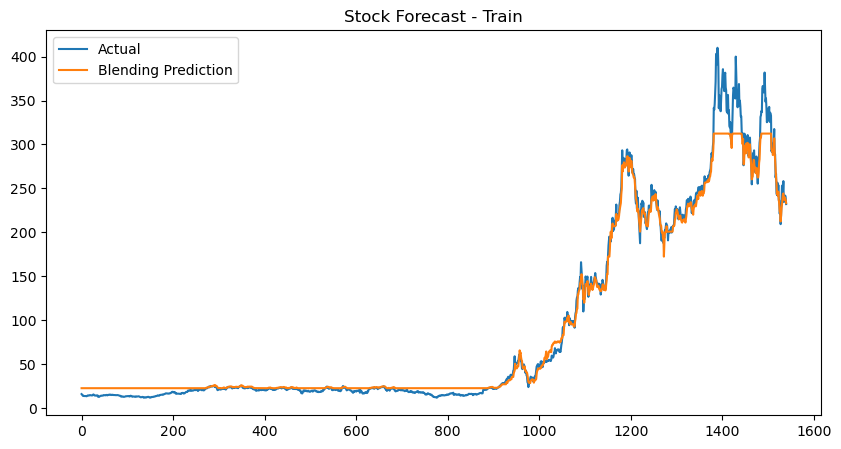

In [12]:
plt.figure(figsize=(10, 5))
plt.plot(y_train_inv, label="Actual")
plt.plot(blending_preds_train, label="Blending Prediction")
plt.title(f"{selected_dataset.title()} Forecast - Train")
plt.legend()
plt.show()

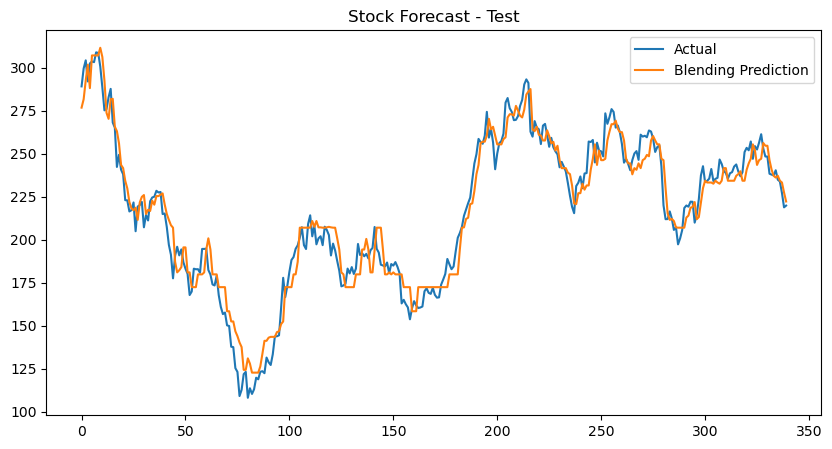

In [13]:
plt.figure(figsize=(10, 5))
plt.plot(y_test_inv, label="Actual")
plt.plot(blending_preds_test, label="Blending Prediction")
plt.title(f"{selected_dataset.title()} Forecast - Test")
plt.legend()
plt.show()

In [14]:
model_rmses = []
for model in selected_models:
    with open(f"../{model}/RMSE_{model}.json", "r") as f:
        rmse_data = json.load(f)
    model_rmses.append(rmse_data[selected_dataset])

model_rmses.append(blending_rmse_test)
labels = selected_models + ["Blending"]

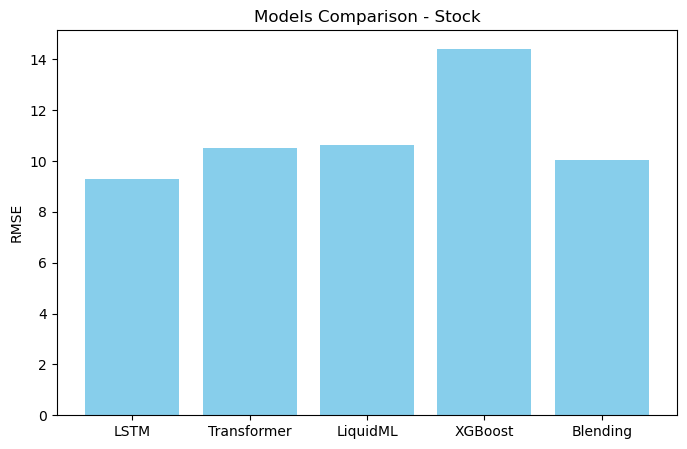

In [15]:
plt.figure(figsize=(8, 5))
plt.bar(labels, model_rmses, color='skyblue')
plt.title(f"Models Comparison - {selected_dataset.title()}")
plt.ylabel("RMSE")
plt.show()